In [1]:
%load_ext autoreload
%autoreload 2

**This notebook is a first inspection of the words used in the extraction. It aims to gets my hands on the data and to quick test off-the-shelf approaches.**


Let's keep in mind:
In the project, we hope to leverage NLP methods to:
- Increase the reliability of the insight:
    - removing false positive: keywords used out of context
    - detect potential keywords forgotten
- Enrich the information:
    - Evaluate the quality of the information
    - Extract speaker name
    - Understand the sentiment associated to the extract
    - Understand the topic tackled beyond the keyword


## Table of Content:
* [ 1. Imports & Data Processing](#import)
* [2. EDA](#eda)
* [3. Off-the-shelf Sentiment Subjectivity analysis](#sent)
* [4. Off-the-shelf Topic modelling](#topic)

# notes:
- it's fishy that no keywords appear together
- lot of meteo topic

# 1. Imports & Data Processing <a class="anchor" id="import"></a>

In [7]:
import sys
sys.path.append("..")

import pandas as pd
import numpy as np

from quotaclimat.data_processing.read_format_deduplicate import read_and_format_all_data_dump, deduplicate_extracts
import nltk
# pre trained sentiment analysis
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from textblob import Blobber
from textblob_fr import PatternTagger, PatternAnalyzer

# text processing
from collections import Counter
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
nltk.download('punkt')

from nltk.stem.snowball import FrenchStemmer
import spacy
spacy_stemmer = spacy.load('fr_core_news_md')
# topic modeling
import gensim

# vizuals
import plotly.graph_objects as go
from wordcloud import WordCloud

nltk.download("stopwords")
stopwords = nltk.corpus.stopwords.words('french')
stopwords.append('<unk>')


def stemming_lemma_tokenize_with_scapy(df):
    """the Scapy stemmer has a lot to offer, but is greddy
    23minutes for 38K extracts
    """
    df['stemmed_text'] = np.NaN
    df['sentiment'] = np.NaN
    df['stemmed_words_token'] = np.NaN

    for i in range(len(df)):
        doc = spacy_stemmer(df.loc[i, 'text_without_stopwords'])
        stemmed_extract = ''
        sentiment_total = 0
        for entity in doc:
            stemmed_extract += ' ' + entity.lemma_
            sentiment_total += entity.sentiment

        df.loc[i, 'stemmed_text'] = stemmed_extract
        df.loc[i, 'sentiment'] = sentiment_total/len(doc)
        #df.loc[i, 'stemmed_words_token'] = stemmed_text
    return df

[nltk_data] Downloading package punkt to /Users/estelle/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/estelle/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


## Clean up text
Data should be in the root of the repo in data/keywords

In [8]:
# data dumps from extract
df_all = read_and_format_all_data_dump()
# deduplicate
df_all = deduplicate_extracts(df_all)
# channel data
top_n = 15
channels = pd.read_excel('../data/channels.xlsx')
top_channels = channels.head(top_n)["CHANNEL_NAME"].tolist()

## Feature engineering

In [10]:
%%time
df_all['nb_of_words'] = df_all['text'].str.split().str.len()
# remove channel name from extract
words_to_remove = stopwords.copy()
words_to_remove.append(channels['CHANNEL_NAME'].str.lower().tolist())
spelt_numbers = ['un', 'deux', 'trois', "quatre", 'cinq', 'six', 'sept', 'huit', 'neuf', 'dix', "vingt", "trente"]
words_to_remove.append(spelt_numbers)
df_all['text_without_stopwords'] = df_all['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (words_to_remove)]))
df_all['nb_of_words_without_stopwords'] = df_all['text_without_stopwords'].str.split().str.len()
df_all['text_without_stopwords'] = df_all['text_without_stopwords'].str.replace('\'', '')
# remove single character 
df_all['text_without_stopwords'] = df_all['text_without_stopwords'].str.replace('(\\b[A-Za-z] \\b|\\b [A-Za-z]\\b)', '', regex=True)

# stemming # lemmatization
df_all = stemming_lemma_tokenize_with_scapy(df_all)  # 23minutes for 38K extracts


CPU times: user 15min 8s, sys: 1min 22s, total: 16min 30s
Wall time: 16min 45s


In [11]:
## Quick check of words counts

In [25]:

#tokenizer 
#df_all['text_token'] = df_all['text_stemmed'].apply(lambda t: word_tokenize(t, language='french'))

# saving time next run:
#df_all.to_csv('df_all_processed.csv')
#df_all = pd.read_csv('df_all_processed.csv')

# vectorizers
#vectorizer = CountVectorizer()
#df_X = pd.DataFrame(vectorizer.fit_transform(df_all["text_stemmed"]).todense())
#df_X.columns = vectorizer.get_feature_names()

tfidf = TfidfVectorizer(max_df=0.75, min_df=0.01)
text_tfidf_sparse = tfidf.fit_transform(df_all["stemmed_text"])
df_tfidf_model = pd.DataFrame(np.asarray(text_tfidf_sparse.sum(axis=0).T), index=tfidf.get_feature_names(), columns=['frequency'])
# save time next run:
#df_X_tfidf.to_pickle('df_X_tfidf.pkl')

/Users/estelle/.pyenv/versions/3.10.2/envs/quotaclimat/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [18]:
vectorizer = CountVectorizer(max_df=0.75, min_df=0.01)
text_cv_sparse = vectorizer.fit_transform(df_all["stemmed_text"])
df_X = pd.DataFrame(text_cv_sparse.todense())
df_X.columns = vectorizer.get_feature_names()

df_word_frequency = pd.DataFrame(np.asarray(text_cv_sparse.sum(axis=0).T), index=vectorizer.get_feature_names(), columns=['frequency'])

/Users/estelle/.pyenv/versions/3.10.2/envs/quotaclimat/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
/Users/estelle/.pyenv/versions/3.10.2/envs/quotaclimat/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [26]:
df_word_frequency.sort_values(by='frequency')

,frequency
conclure,342
sociétal,343
répartir,346
alarmant,346
absolu,346
...,...
ce,51994
deux,52642
cela,58118
qu,58594


In [27]:
df_tfidf_model.sort_values(by='frequency')

,frequency
suffisant,33.232376
sociétal,33.449439
néanmoins,33.713141
absolu,33.871132
relativement,34.042086
...,...
deux,1279.599621
qu,1382.999455
euh,1400.919994
cela,1411.949953


In [20]:
df_all.to_csv('df_all_processed.csv')


# 2. EDA  <a class="anchor" id="EDA"></a>
## Number of words per sample


In [40]:
fig = go.Figure()
fig.add_trace(go.Box(y=df_all['nb_of_words'], x=df_all['media']))
fig.update_layout(title='Number of words per extract per media', width=800, height=350)
fig.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df_all['nb_of_words_without_stopwords'], x=df_all['media']))
fig.update_layout(title='Number of words (without stopwords) per extract per media', width=800, height=350)
fig.show()


In [47]:
# keywords appearing together :grimacing: that's fishy
df_all[df_all.nb_keywords_in_extract > 1]

,index,channel,radio,url,channel_name,date,time,time_of_the_day,media,path_file,count,duration,keywords,nb_keywords_in_extract,text,nb_of_words,text_without_stopwords,nb_of_words_without_stopwords,text_stemmed,text_token


## Words cloud and counts

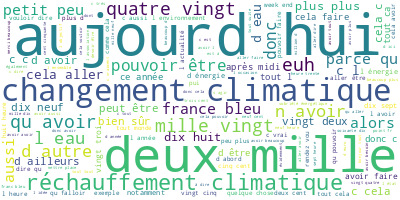

In [21]:
long_string = ','.join(list(df_all['stemmed_text'].values))
wordcloud = WordCloud(background_color="white", max_words=5000, contour_width=3, contour_color='steelblue')
wordcloud.generate(long_string)
wordcloud.to_image()

# 3. Sentiment // Subjectivity  <a class="anchor" id="3sub"></a>

In [37]:
## try out sid
nltk.download('vader_lexicon')
sid = SentimentIntensityAnalyzer()

sid.polarity_scores(df_all.loc[0, 'text'].iloc[0])

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/estelle/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

In [53]:
# try out blobber
tb = Blobber(pos_tagger=PatternTagger(), analyzer=PatternAnalyzer())
df_all['polarity'] = df_all['text_without_stopwords'].apply(lambda txt: tb(txt).polarity)
df_all['subjectivity'] = df_all['text_without_stopwords'].apply(lambda txt: tb(txt).subjectivity)
df_all['sentiment'] = df_all['text_without_stopwords'].apply(lambda txt: tb(txt).sentiment)

In [66]:
fig = go.Figure()
fig.add_trace(go.Box(y=df_all['subjectivity'], x=df_all['media']))
fig.update_layout(title='subjectivity (without stopwords) per extract per media', width=800, height=350)
fig.show()
fig = go.Figure()
fig.add_trace(go.Box(y=df_all['subjectivity'], x=df_all['keyword']))
fig.update_layout(title='subjectivity (without stopwords) per extract per keywords', width=800, height=350)
fig.show()

In [83]:
fig = go.Figure()
df_top_channel = df_all[df_all.channel_name.isin(top_channels)]
df_top_channel_radio = df_top_channel[df_top_channel.media == 'Radio']
df_top_channel_tv = df_top_channel[df_top_channel.media == 'TV']

fig.add_trace(go.Box(y=df_top_channel_radio['subjectivity'], x=df_top_channel_radio['channel_name'], name='Radio', marker_color = 'lightseagreen'))
fig.add_trace(go.Box(y=df_top_channel_tv['subjectivity'], x=df_top_channel_tv['channel_name'], name='TV', marker_color = 'indianred'))

fig.update_layout(title='Distribution of the subjectivity (1 is subjectif, 0 is objectif) of the extracts (without stopwords) per channel (top 15)')
fig.show()

## From ScaPy

In [30]:
df_all['sentiment'].describe()  # doesn't work ?

count    32033.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: sentiment, dtype: float64

# 4. Off-the-shelf topic modeling  <a class="anchor" id="topic"></a>


In [31]:
# TODO/ideas: 
# - remove radio / TV name from extracts

In [34]:
# TODO: check for the french version?
corpus = df_all['stemmed_text']

## pre-process corpus
lst_corpus = []
for string in corpus:
    lst_words = string.split()
    lst_grams = [" ".join(lst_words[i:i + 2]) for i in range(0, 
                     len(lst_words), 2)]
    lst_corpus.append(lst_grams)


In [35]:
id2word = gensim.corpora.Dictionary(lst_corpus)
extracts = [id2word.doc2bow(word) for word in lst_corpus] 
## train LDA
nb_topics = 10
lda_model = gensim.models.ldamodel.LdaModel(corpus=extracts, id2word=id2word, num_topics=nb_topics, random_state=30, alpha='auto', per_word_topics=True)

2022-10-30 20:51:31.618 INFO    gensim.corpora.dictionary: adding document #0 to Dictionary<0 unique tokens: []>
2022-10-30 20:51:33.797 INFO    gensim.corpora.dictionary: adding document #10000 to Dictionary<408277 unique tokens: ["' avoir", "' géant", "' habitude", "' histoire", "' intervenir"]...>
2022-10-30 20:51:35.924 INFO    gensim.corpora.dictionary: adding document #20000 to Dictionary<709386 unique tokens: ["' avoir", "' géant", "' habitude", "' histoire", "' intervenir"]...>
2022-10-30 20:51:38.109 INFO    gensim.corpora.dictionary: adding document #30000 to Dictionary<939508 unique tokens: ["' avoir", "' géant", "' habitude", "' histoire", "' intervenir"]...>
2022-10-30 20:51:38.551 INFO    gensim.corpora.dictionary: built Dictionary<987590 unique tokens: ["' avoir", "' géant", "' habitude", "' histoire", "' intervenir"]...> from 32033 documents (total 3951718 corpus positions)
2022-10-30 20:51:38.554 INFO    gensim.utils: Dictionary lifecycle event {'msg': 'built Dictionar

In [36]:
# to dataframe
lst_dics = []
for i in range(0, nb_topics):
    lst_tuples = lda_model.get_topic_terms(i)
    for tupla in lst_tuples:
        lst_dics.append({"topic":i, "id":tupla[0], 
                         "word":id2word[tupla[0]], 
                         "weight":tupla[1]})
df_all_topics = pd.DataFrame(lst_dics, 
                         columns=['topic','id','word','weight'])
    


In [54]:
df_all_topics.head(20)

,topic,id,word,weight
0,0,82437,parc éolien,0.006533
1,0,5892,lady gaga,0.001942
2,0,11152,reportage retrouver,0.001795
3,0,28082,nouveau rapport,0.001789
4,0,99185,première l',0.001760
5,0,63638,qu' reçoit,0.001608
6,0,69169,rcf clara,0.001332
7,0,20494,reine elizabeth,0.001218
8,0,20455,euros obsèques,0.001192
9,0,20441,coups dix,0.001142


In [37]:
for idx, topic in lda_model.print_topics(-1):
   print('Topic: {} \nWords: {}'.format(idx, topic))

# some don't make that much sense, the cropus is probably too small or nb of topics too large

2022-10-30 20:52:13.464 INFO    gensim.models.ldamodel: topic #0 (7.004): 0.067*"l '" + 0.046*"d '" + 0.031*"c '" + 0.015*"qu '" + 0.010*"s '" + 0.007*"aujourd '" + 0.007*"' hui" + 0.006*"' avoir" + 0.006*"n '" + 0.006*"deux mille"
2022-10-30 20:52:13.475 INFO    gensim.models.ldamodel: topic #1 (0.044): 0.002*"mercredi prochain" + 0.001*"soixante an" + 0.001*"proche chez" + 0.000*"chance cela" + 0.000*"prendre racine" + 0.000*"oiseau sauvage" + 0.000*"santé c" + 0.000*"end l" + 0.000*"aussi président" + 0.000*"propriétaire d"
2022-10-30 20:52:13.487 INFO    gensim.models.ldamodel: topic #2 (0.052): 0.002*"point radio" + 0.001*"pari saint-germain" + 0.001*"partir trois" + 0.001*"cas cent" + 0.000*"pouvoir compter" + 0.000*"bienvenue tout" + 0.000*"soixante-cinq an" + 0.000*"chez" + 0.000*"compte tenir" + 0.000*"naissance d"
2022-10-30 20:52:13.493 INFO    gensim.models.ldamodel: topic #3 (0.086): 0.003*"mettre examen" + 0.003*"trente cent" + 0.003*"décembre deux" + 0.003*"neuf euro" + 

Topic: 0 
Words: 0.067*"l '" + 0.046*"d '" + 0.031*"c '" + 0.015*"qu '" + 0.010*"s '" + 0.007*"aujourd '" + 0.007*"' hui" + 0.006*"' avoir" + 0.006*"n '" + 0.006*"deux mille"
Topic: 1 
Words: 0.002*"mercredi prochain" + 0.001*"soixante an" + 0.001*"proche chez" + 0.000*"chance cela" + 0.000*"prendre racine" + 0.000*"oiseau sauvage" + 0.000*"santé c" + 0.000*"end l" + 0.000*"aussi président" + 0.000*"propriétaire d"
Topic: 2 
Words: 0.002*"point radio" + 0.001*"pari saint-germain" + 0.001*"partir trois" + 0.001*"cas cent" + 0.000*"pouvoir compter" + 0.000*"bienvenue tout" + 0.000*"soixante-cinq an" + 0.000*"chez" + 0.000*"compte tenir" + 0.000*"naissance d"
Topic: 3 
Words: 0.003*"mettre examen" + 0.003*"trente cent" + 0.003*"décembre deux" + 0.003*"neuf euro" + 0.002*"bel éclaircie" + 0.002*"soir avoir" + 0.002*"réunir tout" + 0.002*"dimanche dix" + 0.002*"arbre ville" + 0.001*"vendredi vingt-trois"
Topic: 4 
Words: 0.005*"retour normal" + 0.004*"' agenda" + 0.003*"réquisition salarier